The link to my google colab is:
https://colab.research.google.com/drive/1ctQBm_M7qdYQXYopH5cXV-jiIPaSIjlc?usp=sharing

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn.functional as F
import random
#setting seed so results are reproducible
SEED=1495449
np.random.seed(SEED)
torch.manual_seed(SEED)

#Option 2: A DeepDream-like model
For this project, our goal is to create 'dreams', which are images that have been enhanced by a neural network using a DeepDream model.

##Part 1: A convolutional neural network, dropout and batchnorm



###Task 1: Implement and train a CNN
This task involves training a convolutional neural network and training and testing it on a CIFAR-10 dataset. The goal is to achieve a test accuracy of 60%.

In [ ]:
cifar_train = torchvision.datasets.CIFAR10(
root="./",
download=True,
train=True,
transform=transforms.Compose([transforms.ToTensor()]),
)

cifar_test = torchvision.datasets.CIFAR10(
root="./",
download=True,
train=False,
transform=transforms.Compose([transforms.ToTensor()]),
)

Files already downloaded and verified
Files already downloaded and verified


In [ ]:
def loading_data(batch_size, train_set, test_set):
  """Returns two data loaders, 'trainloader' and 'testloader', which shuffle 
  the data (train set and test set) and batch it according to the given batch size"""
  trainloader = torch.utils.data.DataLoader(train_set, batch_size, shuffle=True)
  testloader = torch.utils.data.DataLoader(test_set, batch_size, shuffle=True)
  return trainloader, testloader

In [ ]:
class Net(nn.Module):
  def __init__(self):
    super().__init__()
    self.conv1 = nn.Conv2d(3, 6, 5) 
    self.pool = nn.MaxPool2d(2, stride=2)
    self.conv2 = nn.Conv2d(6, 16, 5)
    self.fc1 = nn.Linear(16 * 5 * 5, 120)
    self.fc2 = nn.Linear(120, 84)
    self.fc3 = nn.Linear(84, 10)

  def forward(self, x):
    x = self.pool(F.relu(self.conv1(x))) # Apply the first convolutional layer, then ReLU activation, and then max-pooling
    x = self.pool(F.relu(self.conv2(x))) 
    x = torch.flatten(x, 1) # Flatten the tensor along the channel dimension
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = self.fc3(x)
    return x  # Return the output tensor

In [ ]:
def train_epoch(trainloader, net, optimizer, criterion):
  # Set the network to train mode
  net.train()
  running_loss = 0
  correct = 0
  for inputs, labels in trainloader:
      optimizer.zero_grad() # Zero the gradients of the optimizer
      outputs = net(inputs)
      loss = criterion(outputs, labels) # Compute the loss
      loss.backward() # Compute the gradients
      optimizer.step()  # Take an update step
      running_loss += loss.item()

      _, predicted = torch.max(outputs, 1)
      correct += (predicted == labels).sum().item()
  
  # Compute the average loss over all datapoints
  average_loss = running_loss/len(trainloader)
  train_accuracy = correct / len(trainloader.dataset)
  return average_loss, train_accuracy

In [ ]:
def test_epoch(testloader, net, criterion):
  running_loss = 0
  running_error = 0
  correct = 0
  net.eval()  # Set the model to evaluation mode
  
  for inputs, labels in testloader:
    outputs = net(inputs)
    loss = criterion(outputs, labels)
    running_loss += loss.item()
    
    # Find the predicted class by finding the index of the maximum value in the output
    _, predicted = torch.max(outputs, 1)
    
    # Compare the predicted class to the true label and count the number of incorrect predictions
    correct += (predicted == labels).sum().item()
  
  # Compute the average loss and error over all datapoints
  avg_loss = running_loss / len(testloader)
  test_accuracy = correct / len(testloader.dataset)
  
  return avg_loss, test_accuracy

In [ ]:
def run_epochs(epoch_limit, train_set, test_set, net, optimizer, criterion):
  train_loss_list = []
  test_loss_list = []
  train_accuracy_list = []
  test_accuracy_list = []

  for epoch in range(epoch_limit):
    train_loss, train_accuracy = train_epoch(train_set, net, optimizer, criterion)  # Run a train epoch
    test_loss, test_accuracy = test_epoch(test_set, net, criterion)  # Run a test epoch
    print(f"Epoch: {epoch+1} | Train Loss: {train_loss} | Test Loss: {test_loss} | Train Accuracy: {train_accuracy} | Test Accuracy: {test_accuracy}")

    train_loss_list.append(train_loss)
    test_loss_list.append(test_loss)
    train_accuracy_list.append(train_accuracy)
    test_accuracy_list.append(test_accuracy)
  return train_loss_list, test_loss_list, train_accuracy_list, test_accuracy_list

In [ ]:
# Define the hyperparameters
batch_size = 64
learning_rate = 0.001
epoch_limit = 20

# Load the CIFAR 10 datasets
train_set_cifar, test_set_cifar = loading_data(batch_size, cifar_train, cifar_test)

"""Note the default version of cross entropy calculates the mean loss over all 
points in a batch. Hence we divide the averages in train_spoch and test epoch ny 
number of batches to calculate the averages over all datapoints in the dataset."""
criterion = nn.CrossEntropyLoss() # Define the Cross Entropy as the criterion 

In [ ]:
net_cifar = Net()

# Define the adam optimizer
optimizer_cifar = torch.optim.Adam(net_cifar.parameters(), lr=learning_rate)

train_loss_cifar_p1_t1, test_loss_cifar_p1_t1, train_accuracy_cifar_p1_t1, test_accuracy_cifar_p1_t1 = run_epochs(epoch_limit, train_set_cifar, test_set_cifar, net_cifar, optimizer_cifar, criterion)

Epoch: 1 | Train Loss: 1.7265745102597014 | Test Loss: 1.4914071696579076 | Train Accuracy: 0.36402 | Test Accuracy: 0.4547
Epoch: 2 | Train Loss: 1.4413136626448473 | Test Loss: 1.3847871449342959 | Train Accuracy: 0.47704 | Test Accuracy: 0.4971
Epoch: 3 | Train Loss: 1.3367544866888725 | Test Loss: 1.305403109568699 | Train Accuracy: 0.52018 | Test Accuracy: 0.5314
Epoch: 4 | Train Loss: 1.2631604907762668 | Test Loss: 1.2826877103489676 | Train Accuracy: 0.5491 | Test Accuracy: 0.5409
Epoch: 5 | Train Loss: 1.2102596369545784 | Test Loss: 1.2536207801976782 | Train Accuracy: 0.56996 | Test Accuracy: 0.5504
Epoch: 6 | Train Loss: 1.1528769931982241 | Test Loss: 1.183277987370825 | Train Accuracy: 0.58998 | Test Accuracy: 0.5759
Epoch: 7 | Train Loss: 1.1120427778309874 | Test Loss: 1.1507553260797148 | Train Accuracy: 0.60542 | Test Accuracy: 0.5889
Epoch: 8 | Train Loss: 1.0713272557386657 | Test Loss: 1.1633277607571548 | Train Accuracy: 0.61838 | Test Accuracy: 0.5858
Epoch: 9 | 

### Task 2: Dropout

A dropout layer randomly sets some of the neurons to zero. This helps prevent overfitting to the training set. In each forward pass, certain percentage of neurons will be deactivated thus preventing the model from becoming too dependent on a single neuron or sets of neurons (to prevent co-adaptation). Hence a dropout layer helps the model to learn more robust representations of the data.

I will expect the model to generalise better with dropout layers because dropout prevents overfitting to training dataset and encourages the model to help more robust features of the data. Hence should lead to better performance on unseen data.

In [ ]:
# Define the hyperparameters
batch_size = 64
learning_rate = 0.001
epoch_limit = 25

# Load the CIFAR 10 datasets
train_set_cifar, test_set_cifar = loading_data(batch_size, cifar_train, cifar_test)

**Experiment without dropout layer**

This neural network model is a custom CNN architecture. It has three convolutional layers, followed by three fully connected layers for feature extraction and classification, and a final linear layer for output. The model uses ReLU activation functions and max-pooling layers for dimensionality reduction.

In [ ]:
class Net(nn.Module):
  """
  A convolutional neural network class with three convolutional layers and
  four fully connected layers.
  """
  def __init__(self):
    super().__init__()
    self.conv1 = nn.Conv2d(3, 32, 3) 
    self.conv2 = nn.Conv2d(32, 64, 3)
    self.conv3 = nn.Conv2d(64, 128, 3)
    self.pool = nn.MaxPool2d(2, stride=2)
    self.fc1 = nn.Linear(512, 120)
    self.fc2 = nn.Linear(120, 84)
    self.fc3 = nn.Linear(84, 32)
    self.fc4 = nn.Linear(32, 10)
    

  def forward(self, x):
    x = self.pool(F.relu(self.conv1(x))) 
    x = self.pool(F.relu(self.conv2(x)))
    x = self.pool(F.relu(self.conv3(x)))  
    x = torch.flatten(x, 1)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = F.relu(self.fc3(x))
    x = self.fc4(x)
    return x    

In [ ]:
net_cifar = Net()

# Define the adam optimizer
optimizer_cifar = torch.optim.Adam(net_cifar.parameters(), lr=learning_rate)

train_loss_cifar_p1_t2a, test_loss_cifar_p1_t2a, train_accuracy_cifar_p1_t2a, test_accuracy_cifar_p1_t2a = run_epochs(epoch_limit, train_set_cifar, test_set_cifar, net_cifar, optimizer_cifar, criterion)

Epoch: 1 | Train Loss: 1.8156221201047873 | Test Loss: 1.5952054808853537 | Train Accuracy: 0.3077 | Test Accuracy: 0.3764
Epoch: 2 | Train Loss: 1.44392954007439 | Test Loss: 1.43224397358621 | Train Accuracy: 0.46332 | Test Accuracy: 0.4755
Epoch: 3 | Train Loss: 1.252852445292046 | Test Loss: 1.1947358516371174 | Train Accuracy: 0.54416 | Test Accuracy: 0.5635
Epoch: 4 | Train Loss: 1.1257240805022246 | Test Loss: 1.1305536259511473 | Train Accuracy: 0.59424 | Test Accuracy: 0.5998
Epoch: 5 | Train Loss: 1.0373222253206746 | Test Loss: 1.0322796846650968 | Train Accuracy: 0.63096 | Test Accuracy: 0.6316
Epoch: 6 | Train Loss: 0.9589251088516791 | Test Loss: 1.0231107127894261 | Train Accuracy: 0.6591 | Test Accuracy: 0.6466
Epoch: 7 | Train Loss: 0.890221308259403 | Test Loss: 0.9330145652127114 | Train Accuracy: 0.68568 | Test Accuracy: 0.6744
Epoch: 8 | Train Loss: 0.8359134698767796 | Test Loss: 0.9202378692141004 | Train Accuracy: 0.70468 | Test Accuracy: 0.6775
Epoch: 9 | Train

**Experiment with dropout layers**

The model includes a dropout layer with a dropout rate of 0.2, which is applied after each max-pooling layer in the forward pass. 

In [ ]:
class Net(nn.Module):
  def __init__(self):
    super().__init__()
    self.conv1 = nn.Conv2d(3, 32, 3) # Convolutional layer with 3 input channels and 32 output channels. With Kernel size 3 by 3. 
    self.conv2 = nn.Conv2d(32, 64, 3)
    self.conv3 = nn.Conv2d(64, 128, 3)
    self.pool = nn.MaxPool2d(2, stride=2) #Max-pooling layer with 2x2 kernel, stride 2.
    self.fc1 = nn.Linear(512, 120)
    self.fc2 = nn.Linear(120, 84)
    self.fc3 = nn.Linear(84, 32)
    self.fc4 = nn.Linear(32, 10)
    self.dropout = nn.Dropout(0.2)

  def forward(self, x):
    x = self.pool(F.relu(self.conv1(x)))
    x = self.dropout(x) 
    x = self.pool(F.relu(self.conv2(x)))
    x = self.dropout(x)
    x = self.pool(F.relu(self.conv3(x)))  
    x = self.dropout(x)
    x = torch.flatten(x, 1)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = F.relu(self.fc3(x))
    x = self.fc4(x)
    return x    

In [ ]:
net_cifar = Net()

# Define the adam optimizer
optimizer_cifar = torch.optim.Adam(net_cifar.parameters(), lr=learning_rate)

train_loss_cifar_p1_t2b, test_loss_cifar_p1_t2b, train_accuracy_cifar_p1_t2b, test_accuracy_cifar_p1_t2b = run_epochs(epoch_limit, train_set_cifar, test_set_cifar, net_cifar, optimizer_cifar, criterion)

Epoch: 1 | Train Loss: 1.814975262145557 | Test Loss: 1.490558975821088 | Train Accuracy: 0.3056 | Test Accuracy: 0.4458
Epoch: 2 | Train Loss: 1.4265574828133254 | Test Loss: 1.2761224447541935 | Train Accuracy: 0.47254 | Test Accuracy: 0.5445
Epoch: 3 | Train Loss: 1.2717066618335215 | Test Loss: 1.1984634304502209 | Train Accuracy: 0.53834 | Test Accuracy: 0.5674
Epoch: 4 | Train Loss: 1.1745631287012563 | Test Loss: 1.112997310556424 | Train Accuracy: 0.57732 | Test Accuracy: 0.6062
Epoch: 5 | Train Loss: 1.0950433726200972 | Test Loss: 1.0839008658554903 | Train Accuracy: 0.6072 | Test Accuracy: 0.6163
Epoch: 6 | Train Loss: 1.035094762854564 | Test Loss: 0.9947456637765192 | Train Accuracy: 0.63278 | Test Accuracy: 0.6494
Epoch: 7 | Train Loss: 0.9886246485935758 | Test Loss: 0.9129558038559689 | Train Accuracy: 0.64818 | Test Accuracy: 0.675
Epoch: 8 | Train Loss: 0.941354311030844 | Test Loss: 0.9021411321725056 | Train Accuracy: 0.66456 | Test Accuracy: 0.6815
Epoch: 9 | Train

Train loss/test loss after 20 epochs for the model without a dropout layer: 0.48276/0.93552.

Train loss/test loss after 20 epochs for the model with dropout layers: 0.69237/0.72400.

As expected, the training loss has increased for the model with dropout layers as the dropout layer prevents overfitting. The generalization is better than expected for the model with the dropout layer as it achieves a lower test loss.

Discussion about the location of a dropout layer:

 

*   It is clear that one should avoid placing the dropout layer near the input or output layers as it can lead to a loss of information, reducing the performance of the network.
*   It is better to place the dropout layer towards the end of the network because by then, most of the feature learning has been done and hence the model has learned robust representations of the input data. Thus, the dropout will help regularize the network without impacting feature learning.
*   Often, fully connected layers and convolutional layers have a large number of parameters, hence placing a dropout layer after them is quite effective in preventing overfitting.











###Task 3: BatchNorm

Batch normalisation works by normalising the activations of each layer in a batch. This helps to improve the training speed, stability and performance of the model.

Method of batch normalisation:
1.   Compute the mean and variance of the activations in a batch. 
2.   Normalise the activations such that they have a zero mean and unit variance.
3.   Scale and shift the activations using learnable parameters gamma and beta respectively. 
4.   Keep a track of the running mean anad variance of activations in each layer. This will be used in normalisaing the activations during testing. 

Note that the scale and shift parameters in step 3 are important due as they allow for non-linearity, preserve information lost during batch normalisation and helps the model adapt to different scales of input data.

Step 4 is important as the mean and variance of the test data may be different from that of the training data. Also, during training, Batch Normalization normalizes the activations using the mean and variance of the current batch, as well as an exponential moving average of the mean and variance over all the previous batches seen during training. Hence we need the running mean and variance values to be saved.


In [ ]:
# Define the hyperparameters
batch_size = 64
learning_rate = 0.001
epoch_limit = 20

# Load the CIFAR 10 datasets
train_set_cifar, test_set_cifar = loading_data(batch_size, cifar_train, cifar_test)

**Experiment without batch normalisation**

In [ ]:
class Net(nn.Module):
  def __init__(self):
    super().__init__()
    self.conv1 = nn.Conv2d(3, 32, 3) 
    self.conv2 = nn.Conv2d(32, 64, 3)
    self.conv3 = nn.Conv2d(64, 128, 3)
    self.pool = nn.MaxPool2d(2, stride=2)
    self.fc1 = nn.Linear(512, 120)
    self.fc2 = nn.Linear(120, 84)
    self.fc3 = nn.Linear(84, 32)
    self.fc4 = nn.Linear(32, 10)
    

  def forward(self, x):
    x = self.pool(F.relu(self.conv1(x))) 
    x = self.pool(F.relu(self.conv2(x)))
    x = self.pool(F.relu(self.conv3(x)))  
    x = torch.flatten(x, 1)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = F.relu(self.fc3(x))
    x = self.fc4(x)
    return x   

In [ ]:
net_cifar = Net()

# Define the adam optimizer
optimizer_cifar = torch.optim.Adam(net_cifar.parameters(), lr=learning_rate)

train_loss_cifar_p1_t3a, test_loss_cifar_p1_t3a, train_accuracy_cifar_p1_t3a, test_accuracy_cifar_p1_t3a = run_epochs(epoch_limit, train_set_cifar, test_set_cifar, net_cifar, optimizer_cifar, criterion)

Epoch: 1 | Train Loss: 1.7990635852984456 | Test Loss: 1.50045392239929 | Train Accuracy: 0.31962 | Test Accuracy: 0.4341
Epoch: 2 | Train Loss: 1.4285808839761387 | Test Loss: 1.3034445510548391 | Train Accuracy: 0.4733 | Test Accuracy: 0.5271
Epoch: 3 | Train Loss: 1.2403073986168103 | Test Loss: 1.1955135855705115 | Train Accuracy: 0.55288 | Test Accuracy: 0.5657
Epoch: 4 | Train Loss: 1.1131831543219974 | Test Loss: 1.154984229689191 | Train Accuracy: 0.60244 | Test Accuracy: 0.5913
Epoch: 5 | Train Loss: 1.01803648738605 | Test Loss: 1.0368508104306118 | Train Accuracy: 0.63536 | Test Accuracy: 0.6368
Epoch: 6 | Train Loss: 0.9375038877929873 | Test Loss: 1.0066579777723665 | Train Accuracy: 0.66828 | Test Accuracy: 0.6518
Epoch: 7 | Train Loss: 0.8715843899399424 | Test Loss: 1.0025032686579758 | Train Accuracy: 0.69028 | Test Accuracy: 0.6509
Epoch: 8 | Train Loss: 0.8182192397163347 | Test Loss: 0.9666472388680574 | Train Accuracy: 0.71178 | Test Accuracy: 0.6647
Epoch: 9 | Tra

**Experiment with batch normalisation**

This model incorporates batch normalization after each convolutional layer using BatchNorm2d. The batch normalization layers (bn1, bn2, and bn3) normalize the output of the corresponding convolutional layers (conv1, conv2, and conv3).

In [ ]:
class Net(nn.Module):
  """The network contains three convolutional layers followed by batch normalization
    and max-pooling layers, and four fully connected layers."""
  def __init__(self):
    super().__init__()
    self.conv1 = nn.Conv2d(3, 32, 3) 
    self.bn1 = nn.BatchNorm2d(32) #Batch normalization layer for 32 channels in 2D input.
    self.conv2 = nn.Conv2d(32, 64, 3)
    self.bn2 = nn.BatchNorm2d(64)
    self.conv3 = nn.Conv2d(64, 128, 3)
    self.bn3 = nn.BatchNorm2d(128)
    self.pool = nn.MaxPool2d(2, stride=2)
    self.fc1 = nn.Linear(512, 120)
    self.fc2 = nn.Linear(120, 84)
    self.fc3 = nn.Linear(84, 32)
    self.fc4 = nn.Linear(32, 10)
    

  def forward(self, x):
    x = self.pool(F.relu(self.bn1(self.conv1(x))))
    x = self.pool(F.relu(self.bn2(self.conv2(x))))
    x = self.pool(F.relu(self.bn3(self.conv3(x))))
    x = torch.flatten(x, 1)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = F.relu(self.fc3(x))
    x = self.fc4(x)
    return x

In [ ]:
net_cifar = Net()

# Define the adam optimizer
optimizer_cifar = torch.optim.Adam(net_cifar.parameters(), lr=learning_rate)

train_loss_cifar_p1_t3b, test_loss_cifar_p1_t3b, train_accuracy_cifar_p1_t3b, test_accuracy_cifar_p1_t3b = run_epochs(epoch_limit, train_set_cifar, test_set_cifar, net_cifar, optimizer_cifar, criterion)

Epoch: 1 | Train Loss: 1.3204518746384575 | Test Loss: 1.1592917005727246 | Train Accuracy: 0.51638 | Test Accuracy: 0.6019
Epoch: 2 | Train Loss: 0.9416576751205318 | Test Loss: 0.9512594399178863 | Train Accuracy: 0.66718 | Test Accuracy: 0.6705
Epoch: 3 | Train Loss: 0.7908357265965104 | Test Loss: 1.0925436931051267 | Train Accuracy: 0.72348 | Test Accuracy: 0.6339
Epoch: 4 | Train Loss: 0.6852804075574022 | Test Loss: 0.9826418939669421 | Train Accuracy: 0.7626 | Test Accuracy: 0.6744
Epoch: 5 | Train Loss: 0.6132319634756469 | Test Loss: 0.8076535898029424 | Train Accuracy: 0.78518 | Test Accuracy: 0.7196
Epoch: 6 | Train Loss: 0.5507633679205804 | Test Loss: 0.7549985394736004 | Train Accuracy: 0.80824 | Test Accuracy: 0.7392
Epoch: 7 | Train Loss: 0.48669344404012044 | Test Loss: 0.8463784406898888 | Train Accuracy: 0.83154 | Test Accuracy: 0.7249
Epoch: 8 | Train Loss: 0.4400814659036029 | Test Loss: 0.8584234424077781 | Train Accuracy: 0.84928 | Test Accuracy: 0.7186
Epoch: 9

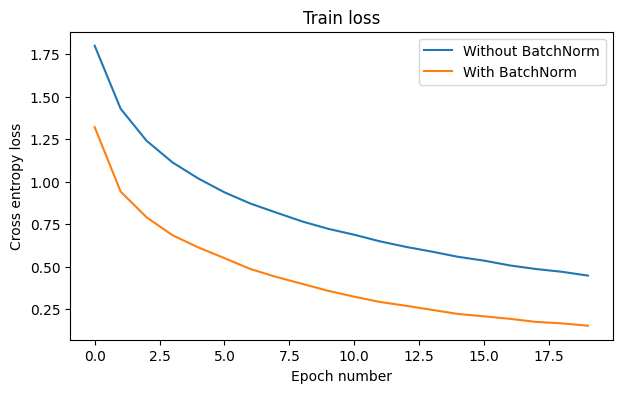

In [ ]:
plt.figure(figsize=(7, 4))  # width, height

plt.plot(train_loss_cifar_p1_t3a, label='Without BatchNorm')
plt.plot(train_loss_cifar_p1_t3b, label='With BatchNorm')
plt.title('Train loss')

plt.ylabel('Cross entropy loss')
plt.xlabel('Epoch number')

plt.legend()
plt.show()

The train loss for the model with BatchNorm decreases faster than for a model without BatchNorm for the first 5 epochs. Afterwards, the decrease in train loss is the same for both models. We find that the train loss is always lower for the model with BatchNorm. This occurs because BatchNorm improves the training process by reducing internal covariate shift, which occurs when the distribution of input data changes during training.

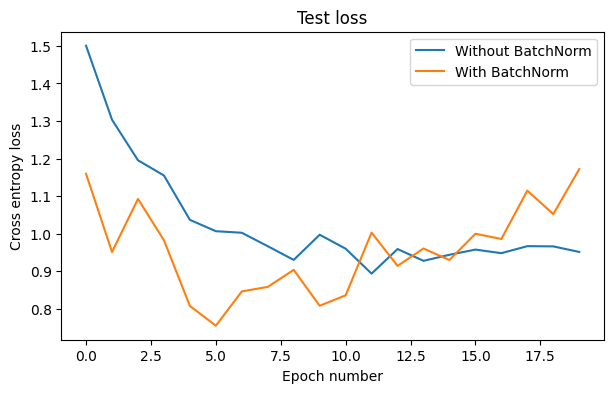

In [ ]:
plt.figure(figsize=(7, 4))  # width, height

plt.plot(test_loss_cifar_p1_t3a, label='Without BatchNorm')
plt.plot(test_loss_cifar_p1_t3b, label='With BatchNorm')
plt.title('Test loss')

plt.ylabel('Cross entropy loss')
plt.xlabel('Epoch number')

plt.legend()
plt.show()

 
The test loss for the model initially decreases faster and is lower than the model without BatchNorm. However, after 10 epochs, the test loss for the model with BatchNorm starts to increase again. The reason for the test loss increasing after 10 epochs is due to the model overfitting to the training set. Batch normalization helps in speeding up training and achieving better performance on the training set, but it does not directly prevent overfitting.

The test loss starts to level out after 10 epochs for the model without BatchNorm. This could be due to the model converging. The model has reached the maximum level of generalization possible with its architecture.

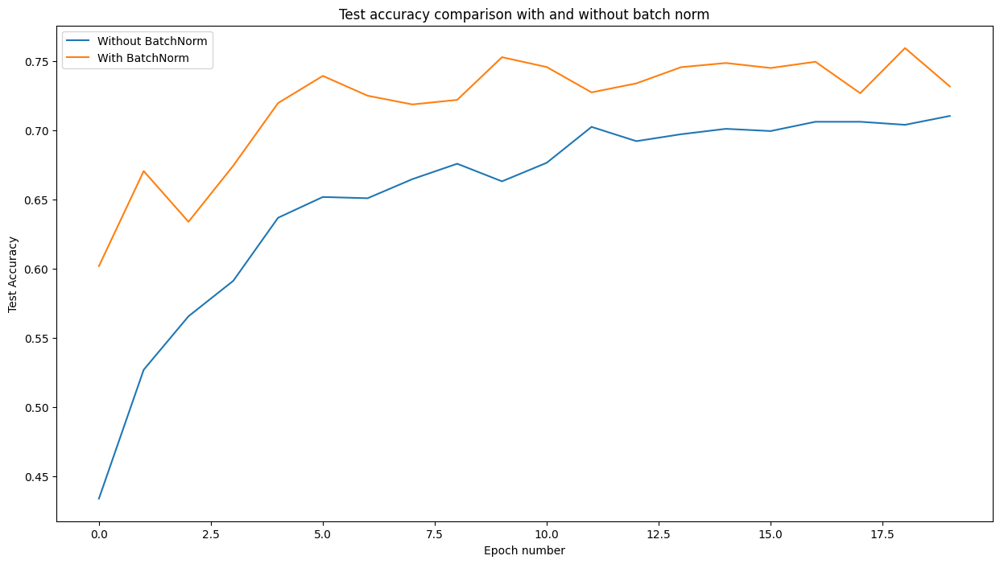

In [ ]:
figure = plt.figure()
figure.set_size_inches(15, 8) # width, height

plt.plot(test_accuracy_cifar_p1_t3a, label = 'Without BatchNorm')
plt.plot(test_accuracy_cifar_p1_t3b, label = 'With BatchNorm')
plt.title('Test accuracy comparison with and without batch norm')

plt.ylabel('Test Accuracy')
plt.xlabel('Epoch number')

plt.legend()
plt.show()

The test accuracy for the model with BatchNorm is always higher than the model without BatchNorm and plateaus at a higher accuracy.

Without Batch Normalization, the training process is more sensitive to the choice of learning rate and weight initialization, which can potentially lead to slower convergence or vanishing/exploding gradients.

#Part 2: The DeepDream method
In this part i will be working with a pre-trained Inception-V3 model. The goal is to enhance an image by maximizing the activation values of a certain layer in the neural network. I will load an image and pass it through the model to obtain activation outputs from a specific layer. I will then use a gradient ascent method to maximize the norm of the activations over the input image, creating a "dream" image that emphasizes what that layer activations "like" to see.

###Task 1: Load an image


In [ ]:
import urllib
from PIL import Image

In [ ]:
url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg","dog.jpg")
try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)
# sample execution (requires torchvision)
from PIL import Image
from torchvision import transforms
input_image = Image.open(filename)
preprocess = transforms.Compose([
transforms.Resize(299),
transforms.CenterCrop(299),
transforms.ToTensor(),
transforms.Normalize(mean=[0.485, 0.456, 0.406],
std=[0.229, 0.224, 0.225]),
])

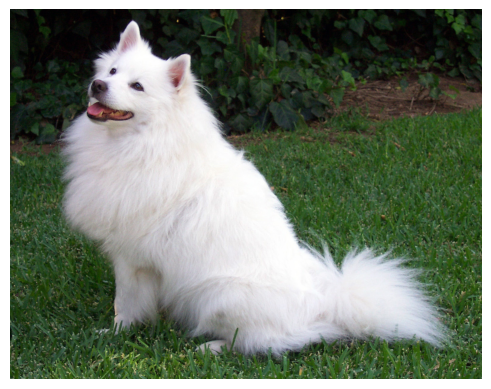

In [ ]:
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)  # create a minibatch as expected by the model

# Display the initial image
plt.imshow(input_image)
plt.axis('off')
plt.show()

###Task 2: Load the pre-trained model and write code to allow for a ’hook’


Below 'torch.hub.load' function downloads the a pre-trained Inception-V3 model from 'the pytorch/vision:v0.10.0' repository. 'model.eval()' sets the model in evaluation mode, this is needed when using the model for inference as it turns of features such as dropout that are only needed during training.

In [ ]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'inception_v3', pretrained=True)
model.eval()

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [ ]:
model(input_batch)

tensor([[ 1.5696e-01,  1.1051e-01, -4.4363e-01, -6.1476e-02, -2.0093e-01,
          1.6820e-01,  5.8117e-01,  6.0333e-02, -7.7651e-02, -1.1192e+00,
         -2.1800e-01, -5.2624e-01, -1.1816e-01,  6.6276e-02,  8.4988e-01,
         -5.3259e-02, -4.7113e-01, -2.6000e-03,  2.7504e-01,  1.7060e-01,
          4.4231e-01, -3.8615e-01,  1.3482e-01, -5.2202e-01, -3.3666e-04,
         -2.3492e-01, -2.3264e-01, -7.1883e-03,  1.6899e-02, -1.2724e-01,
          2.0508e-01, -6.9889e-03,  1.3074e+00, -2.3181e-01,  9.8966e-01,
         -7.7782e-01,  4.8900e-01, -4.2244e-01, -2.6523e-01, -1.5005e-01,
          3.5147e-01, -1.7462e-01,  1.0251e-01,  4.2223e-01, -1.4342e-01,
          1.3578e-02, -4.6477e-01,  3.5966e-01,  1.5194e-01,  2.0217e-01,
         -1.3763e-01,  1.4986e-01,  2.8415e-01, -3.7086e-01,  9.7688e-01,
          7.9543e-01, -7.4032e-01, -7.8853e-02, -9.6365e-02,  1.2193e-01,
         -1.2712e-01,  3.6825e-01, -4.5355e-01, -7.4801e-01, -7.9355e-02,
          2.1688e-01,  2.7018e-01,  1.

The hook below is useful when we want to extract information from a model at a specific point during forward or backward pass. In our case to get the activations from an intermediate layer.

The hook function adds the 'output' tensor to a list called outputs. Later we will attached hook to a mixed layer (combination of several parallel convolutional layers). Every time the mixed mixed layer is executed in a forwrad pass, the output tensor will be appended, allowing us to access the intermediate feature maps of the layer.

In [ ]:
outputs= []
def hook(module, input, output):
  outputs.append(output)

###Task 3: Create a hook
Registers the hook function to be called during the forward pass of the 'Mixed_6e' layer.

In [ ]:
h=model.Mixed_6a.register_forward_hook(hook)

I chose 'Mixed_6a' as this is a good layer to produce dream-like images because it contains a diverse set of filters that respond to a wide range of patterns and features in the input image.

###Task 4: Implement the deepdream optimisation loop
In this task I will implement a gradient ascent optimization function to enhance the input image based on activations of a chosen layer.

I will use a learning rate of 0.1 and run the deepdream optimisation look for 30 iterations. 

In [ ]:
# Add the deprocess function
deprocess = transforms.Compose([
    transforms.Normalize(mean=[0.,0.,0.],
                        std=[1/0.229, 1/0.224, 1/0.225]),
    transforms.Normalize(mean=[-0.485, -0.456, -0.406],
                         std = [ 1., 1., 1. ]),
    ])


def deepdream_optimization(iterations, learning_rate, input_image):
  input_image.requires_grad = True
  for i in range(iterations):
    model.zero_grad()
    model(input_image)
    activations = outputs[-1] #  getting the output of the hook
    loss = torch.norm(activations, p=2) # the L2 norm of the activations from my chosen layer
    loss.backward()
    grad = input_image.grad.data
    grad /= torch.abs(grad).mean()
    input_image.data += learning_rate * grad  # Update the input image using the learning rate and normalized gradients
    input_image.grad.data.zero_()

    # Include the image deprocessing steps
    output_image = input_image.detach().cpu()
    output_image = deprocess(output_image.squeeze())
    output_image = np.transpose(output_image, (1,2,0))  # Transpose the output image to the correct dimension order
  return output_image

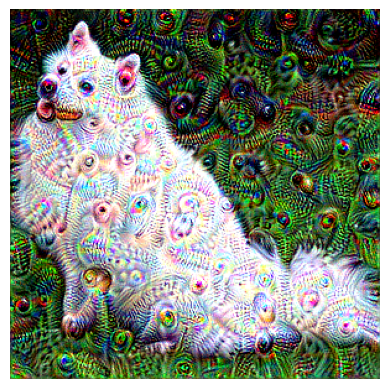

In [ ]:
dream_image = deepdream_optimization(30, 0.1, input_batch.clone())
plt.imshow(dream_image)
plt.axis('off')
plt.show()

This is clearly a dream like image! The image is quite surreal and psychedelic, with vivid colors, patterns, and textures.

###Task 5: Present comparisons of outputs 
In this task, i will show the images generated by the DeepDream optimization algorithm for various choices of layer activations and for different number of optimisation steps. 

In [ ]:
h.remove() # Remove the forward hook from the specified layer

In [ ]:
iterations_to_test=[8, 16, 32, 64]
layers_to_test = ['Mixed_6a', 'Mixed_6b', 'Mixed_6c', 'Mixed_6d',]

In [ ]:
def deepdream_layer_specific(layer_name, input_image, iterations, learning_rate):
  output=[]
  h=getattr(model, layer_name).register_forward_hook(hook)
  dream = deepdream_optimization(iterations, learning_rate, input_image)
  h.remove()
  return dream

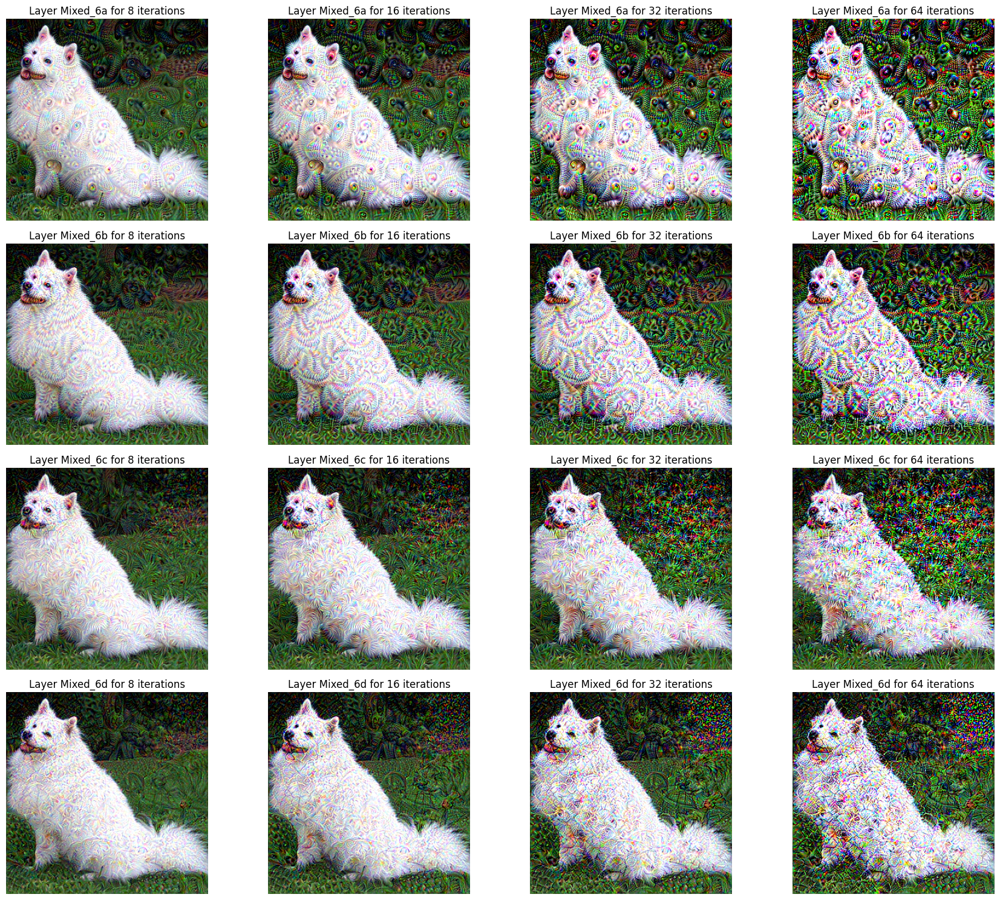

In [ ]:
figure, axis = plt.subplots(len(layers_to_test), len(iterations_to_test))
figure.set_size_inches(18, 15) # width, height

learning_rate = 0.1

for i, layer_name in enumerate(layers_to_test):
    for j, iterations in enumerate(iterations_to_test):
      dream_image = deepdream_layer_specific(layer_name, input_batch.clone(), iterations, learning_rate)
      
      axis[i, j].imshow(dream_image)
      axis[i, j].set_title('Layer {} for {} iterations'.format(layer_name, iterations))
      axis[i, j].axis('off')
      axis[i, j].set_xticks([])
      axis[i, j].set_yticks([])


plt.tight_layout()
plt.show()

We see that as we increase the number of iterations, the patterns and textures in the dream image become stronger. I also noticed that Layer Mixed_6c, at 64 iterations, has produced an overly distorted image and has lost original content such as the waviness of the dog's fur.

Furthermore, I have noticed that at 64 iterations for different layers, the images evoke different emotions.

In [ ]:
iterations_to_test=[30]
layers_to_test = ['Conv2d_4a_3x3', 'Mixed_5b', 'Mixed_6b', 'Mixed_7b',]

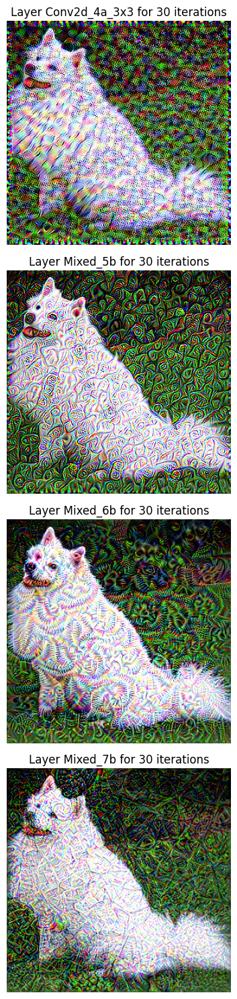

In [ ]:
figure, axis = plt.subplots(len(layers_to_test), len(iterations_to_test))
figure.set_size_inches(18, 15) # width, height

learning_rate = 0.1

for i, layer_name in enumerate(layers_to_test):
    for j, iterations in enumerate(iterations_to_test):
      dream_image = deepdream_layer_specific(layer_name, input_batch.clone(), iterations, learning_rate)
      
      axis[i].imshow(dream_image)
      axis[i].set_title('Layer {} for {} iterations'.format(layer_name, iterations))
      axis[i].axis('off')
      axis[i].set_xticks([])
      axis[i].set_yticks([])


plt.tight_layout()
plt.show()

I noticed that for earlier layers, such as Mixed_5b, the image exhibits simple and repeated textures. For this layer, it seems like the swirls are able to pick up the outline of the dog.

As we go deeper into the layers, we get more abstract patterns that are less repeatable. For example, the dream image from Mixed_7b seems to be where the neural network captures more complex features of the image, such as the face and feet of the dog.



###Task 6: Improve the results by allowing to optimise for multiple layer activations

In this task, I will modify the existing method to optimize for multiple layer activations by registering hooks for multiple layers and computing the L2 norm loss for their outputs in the gradient ascent loop.

In [ ]:
activation = {}
def modified_hook(name):
  def hook(model, input, output):
    activation[name] = output
  return hook

In [ ]:
def deepdream_optimization(iterations, learning_rate, input_image, layers):
    input_image.requires_grad = True
    hooks = []
    for layer_name in layers:
        h = getattr(model, layer_name).register_forward_hook(modified_hook(layer_name))
        hooks.append(h)

    for i in range(iterations):
        model.zero_grad()
        model(input_image)        
        # Calculate the sum of L2 norms for all layers
        loss = sum(torch.norm(activation[layer_name], p=2) for layer_name in layers)
        loss.backward()
        grad = input_image.grad.data
        grad /= torch.abs(grad).mean()
        input_image.data += learning_rate * grad
        input_image.grad.data.zero_()

    for h in hooks:
        h.remove()

    # Include the image deprocessing steps
    output_image = input_image.detach().cpu()
    output_image = deprocess(output_image.squeeze())
    output_image = np.transpose(output_image, (1, 2, 0))
    return output_image

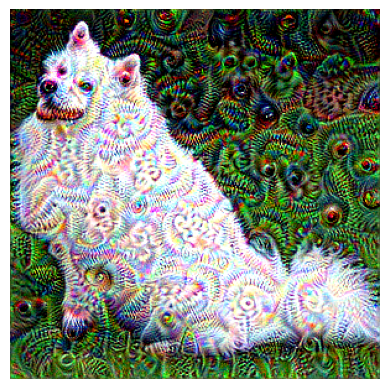

In [ ]:
layers_to_optimize = ["Mixed_6a", "Mixed_6b"]

dream_image = deepdream_optimization(layers = layers_to_optimize, input_image= input_batch.clone(), iterations = 30, learning_rate = 0.1)

plt.imshow(dream_image)
plt.axis('off')
plt.show()

This image is more abstract than the seperate images at "Mixed_6a" and "Mixed_6b" for similiar epochs. It looks liek the generated image contains a combination of features from the selected layers. The resultant image is picking up on lower (fur texture) and high level (shape of face and feet) detail in the image.

###Task 7: Play around with the model and create your own dream

In this task, I will load the painting by Vincent Van Gogh of his bedroom, generate a "dream" image based on the neural network's activations that I find most appealing.

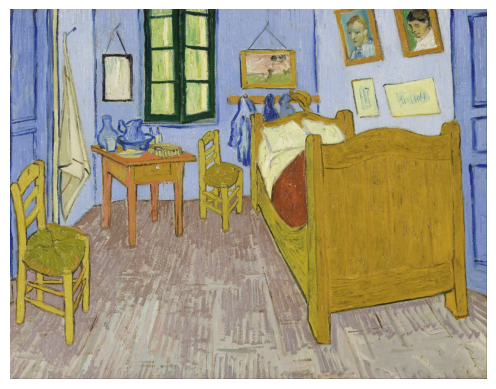

In [ ]:
from PIL import Image
import urllib.request

# URL of the image
url = "https://www.vangoghgallery.com/painting/img/bedroom_full.jpeg"

# Download the image and save it as "vangogh_bedroom.jpg"
urllib.request.urlretrieve(url, "vangogh_bedroom.jpg")

# Open and display the image using PIL
input_image = Image.open("vangogh_bedroom.jpg")
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)

# Display the initial image
plt.imshow(input_image)
plt.axis('off')
plt.show()

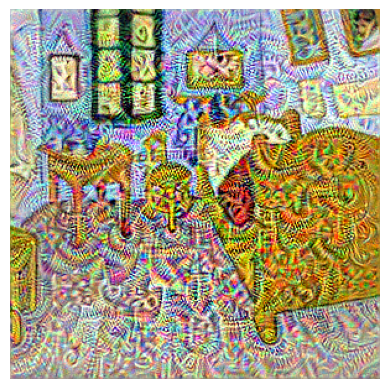

In [ ]:
layers_to_optimize = ["Mixed_6b"]

dream_image = deepdream_optimization(layers = layers_to_optimize, input_image= input_batch.clone(), iterations = 30, learning_rate = 0.1)

plt.imshow(dream_image)
plt.axis('off')
plt.show()

I really like this image as it creates flowery swirls that seem to focus on the objects made out of wood. It seems like there are sound waves coming out from the paintings on the wall. There is a lot going on in the image and it draws you in until you start seeing patterns and objects that aren't there.